In [0]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

Uploading the data 

In [0]:
df=pd.read_excel("data.xlsx")

In [588]:
df.head(100)


,trip_id,customer_id,timestamp,pick_lat,pick_lng,drop_lat,drop_lng,travel_distance,travel_time,trip_fare
0,ID001,CUST_001,1546709270211,17.442705,78.387878,17.457829,78.399056,2.806,12.609667,37
1,ID002,CUST_002,1546709309524,17.490189,78.415512,17.450548,78.367294,11.991,24.075200,119
2,ID003,CUST_003,1546709331857,17.370108,78.515045,17.377041,78.517921,1.322,8.708300,27
3,ID004,CUST_004,1546709358403,17.439314,78.443001,17.397131,78.516586,11.822,24.037550,121
4,ID005,CUST_005,1546709386884,17.432325,78.381966,17.401625,78.400032,6.978,16.120867,58
...,...,...,...,...,...,...,...,...,...,...
95,ID096,CUST_095,1546711103862,17.443785,78.387253,17.453892,78.364342,3.535,8.034767,41
96,ID097,CUST_096,1546711108590,17.455213,78.412224,17.424635,78.444229,7.542,17.927200,73
97,ID098,CUST_097,1546711130581,17.444265,78.470650,17.368437,78.472252,11.301,24.227967,118
98,ID099,CUST_098,1546711143714,17.374325,78.499916,17.398399,78.443985,10.078,30.163150,96


In [589]:
df.dtypes


trip_id             object
customer_id         object
timestamp            int64
pick_lat           float64
pick_lng           float64
drop_lat           float64
drop_lng           float64
travel_distance    float64
travel_time        float64
trip_fare            int64
dtype: object

Drop the columns which are not needed in Explolatory Data Analysis

In [0]:
df_new = df.drop(['pick_lat','pick_lng','drop_lat','drop_lng'], axis=1)

In [591]:
df_new.head()

,trip_id,customer_id,timestamp,travel_distance,travel_time,trip_fare
0,ID001,CUST_001,1546709270211,2.806,12.609667,37
1,ID002,CUST_002,1546709309524,11.991,24.075200,119
2,ID003,CUST_003,1546709331857,1.322,8.708300,27
3,ID004,CUST_004,1546709358403,11.822,24.037550,121
4,ID005,CUST_005,1546709386884,6.978,16.120867,58


In [0]:
df_new = df_new.rename(columns={'Travel_distance':'Distance', 'travel_time': 'Time','trip_fare':'Trip Fare'})

In [593]:
df_new.head()

,trip_id,customer_id,timestamp,travel_distance,Time,Trip Fare
0,ID001,CUST_001,1546709270211,2.806,12.609667,37
1,ID002,CUST_002,1546709309524,11.991,24.075200,119
2,ID003,CUST_003,1546709331857,1.322,8.708300,27
3,ID004,CUST_004,1546709358403,11.822,24.037550,121
4,ID005,CUST_005,1546709386884,6.978,16.120867,58


In [594]:
df_new.shape

(44587, 6)

In [595]:
duplicate_rows_df = df_new[df_new.duplicated()]
print('number of duplicate rows: ', duplicate_rows_df.shape)

number of duplicate rows:  (0, 6)


In [596]:
df_new.count()

trip_id            44587
customer_id        44587
timestamp          44587
travel_distance    44587
Time               44587
Trip Fare          44587
dtype: int64

In [597]:
print(df_new.isnull().sum())

trip_id            0
customer_id        0
timestamp          0
travel_distance    0
Time               0
Trip Fare          0
dtype: int64


Generating the Correlation matrix for extracting the main features 

,timestamp,travel_distance,Time,Trip Fare
timestamp,1.000000,0.007998,-0.001148,0.006890
travel_distance,0.007998,1.000000,0.371180,0.889397
Time,-0.001148,0.371180,1.000000,0.345552
Trip Fare,0.006890,0.889397,0.345552,1.000000


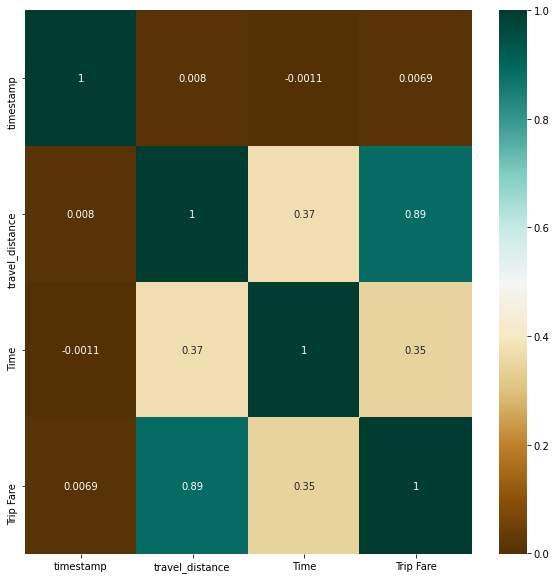

In [598]:

import seaborn as sns
plt.figure(figsize=(10,10))
c= df_new.corr()
sns.heatmap(c,cmap='BrBG',annot=True)
c

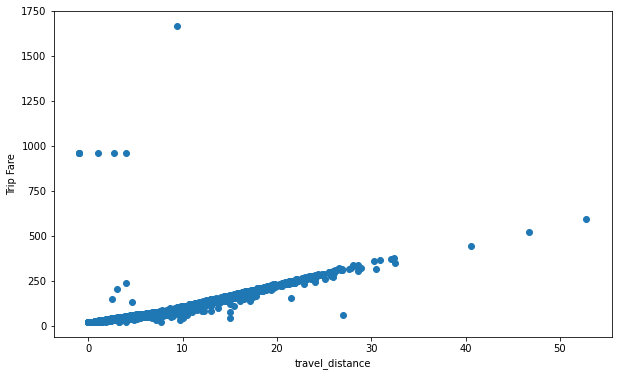

In [599]:
fig, ax = plt.subplots(figsize=(10,6))
ax.scatter(df_new['travel_distance'], df_new['Trip Fare'])
ax.set_xlabel('travel_distance')
ax.set_ylabel('Trip Fare')
plt.show()

Univariate Analysis of Data

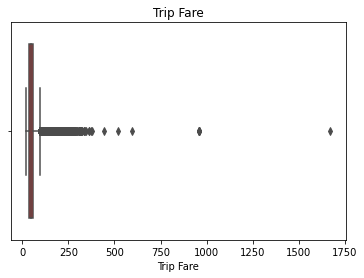

<Figure size 720x432 with 0 Axes>

In [600]:
sns.boxplot(df_new['Trip Fare'],color = 'red',)
plt.title('Trip Fare')
plt.figure(figsize=(10, 6))
plt.show()

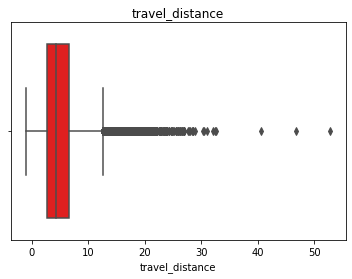

<Figure size 720x432 with 0 Axes>

In [601]:
sns.boxplot(df_new['travel_distance'],color = 'red',)
plt.title('travel_distance')
plt.figure(figsize=(10, 6))
plt.show()

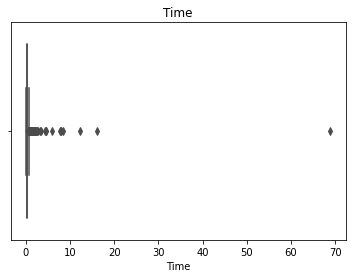

<Figure size 720x432 with 0 Axes>

In [602]:
sns.boxplot(df_new['Time']/60,color = 'red',)
plt.title('Time')
plt.figure(figsize=(10, 6))
plt.show()

In [0]:
df_new['Time'] = df_new['Time'] / 60

In [604]:
df_new.head()

,trip_id,customer_id,timestamp,travel_distance,Time,Trip Fare
0,ID001,CUST_001,1546709270211,2.806,0.210161,37
1,ID002,CUST_002,1546709309524,11.991,0.401253,119
2,ID003,CUST_003,1546709331857,1.322,0.145138,27
3,ID004,CUST_004,1546709358403,11.822,0.400626,121
4,ID005,CUST_005,1546709386884,6.978,0.268681,58


In [605]:
count=df_new.customer_id.value_counts()
count_2=count[count>=2]
count_2

CUST_279      53
CUST_4119     25
CUST_3100     25
CUST_1237     21
CUST_232      21
              ..
CUST_5869      2
CUST_5414      2
CUST_3739      2
CUST_11657     2
CUST_10729     2
Name: customer_id, Length: 9130, dtype: int64

In [0]:
df_new.groupby([count[count>=2]])['Time'].agg(lambda x: x.unique().sum()/x.nunique())
df_new.to_excel("output.xlsx", sheet_name='Sheet_name_1')  






Text(0.5, 1.0, 'Distribution of Trip Fare')

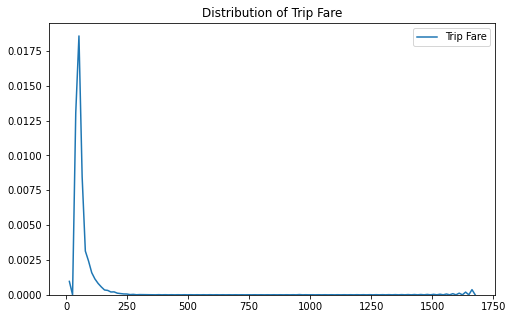

In [607]:
plt.figure(figsize=(8,5))
sns.kdeplot(df_new['Trip Fare']).set_title("Distribution of Trip Fare")

In [608]:
df_new.loc[df_new['Trip Fare']<0].shape

(0, 6)

Text(0.5, 1.0, 'Distribution of fare amount (log scale)')

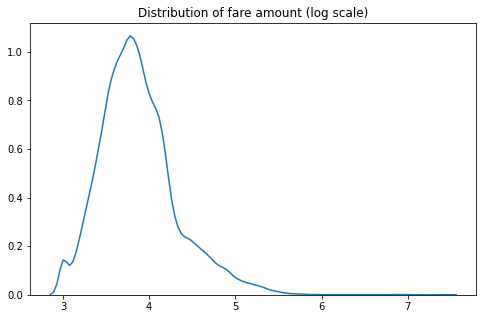

In [609]:
plt.figure(figsize=(8,5))
sns.kdeplot(np.log(df_new['Trip Fare'].values)).set_title("Distribution of fare amount (log scale)")

Text(0.5, 1.0, 'Trip Distance vs Fare Amount')

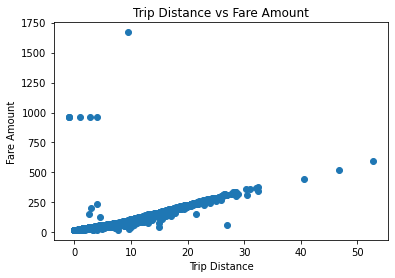

In [610]:
plt.scatter(x=df_new['travel_distance'],y=df_new['Trip Fare'])
plt.xlabel("Trip Distance")
plt.ylabel("Fare Amount")
plt.title("Trip Distance vs Fare Amount")

In [611]:
print("There are {} trip records with 0 km distance".format(df_new.travel_distance[df_new.travel_distance == 0 ].count()))

There are 231 trip records with 0 km distance


In [612]:
df[df.travel_distance == 0 ].head()

,trip_id,customer_id,timestamp,pick_lat,pick_lng,drop_lat,drop_lng,travel_distance,travel_time,trip_fare
55,ID056,CUST_056,1546710133113,17.409777,78.462952,17.409777,78.462952,0.0,0.052050,20
152,ID153,CUST_149,1546712538963,17.385977,78.431549,17.385977,78.431549,0.0,0.242750,20
155,ID156,CUST_152,1546712580519,17.426565,78.452843,17.426565,78.452843,0.0,0.261333,20
249,ID250,CUST_243,1546532267170,17.438530,78.394989,17.468258,78.360641,0.0,0.101450,20
587,ID588,CUST_561,1546536445984,17.406101,78.409821,17.433184,78.418320,0.0,0.050750,20


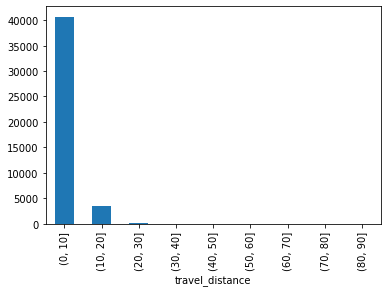

In [613]:
df.travel_distance.groupby(pd.cut(df.travel_distance, np.arange(0,100,10))).count().plot(kind='bar')
plt.show()

In [614]:
df.travel_time.describe()

count    44587.000000
mean        15.819835
std         23.462865
min          0.022750
25%          8.428525
50%         13.126250
75%         20.111167
max       4134.388700
Name: travel_time, dtype: float64

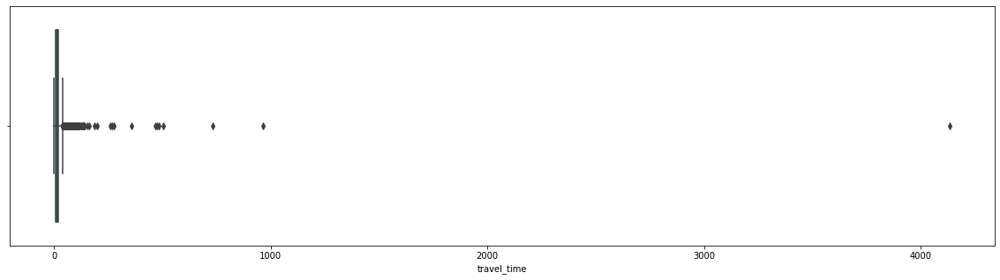

In [615]:
plt.figure(figsize = (20,5))
sns.boxplot(df.travel_time)
plt.show()

In [616]:
df.travel_time.groupby(pd.cut(df.travel_time, np.arange(1,60,10))).count()

travel_time
(1, 11]     16996
(11, 21]    16963
(21, 31]     6761
(31, 41]     2190
(41, 51]      733
Name: travel_time, dtype: int64

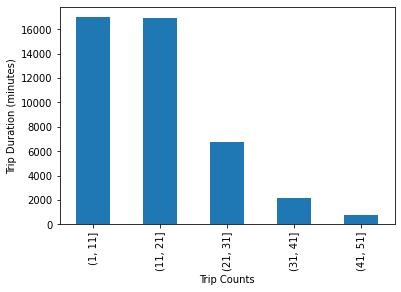

In [617]:
df.travel_time.groupby(pd.cut(df.travel_time, np.arange(1,60,10))).count().plot(kind='bar')
plt.xlabel('Trip Counts')
plt.ylabel('Trip Duration (minutes)')
plt.show()

In [618]:
df.trip_fare.describe()

count    44587.000000
mean        53.872833
std         33.430462
min         20.000000
25%         36.000000
50%         46.000000
75%         60.000000
max       1670.000000
Name: trip_fare, dtype: float64

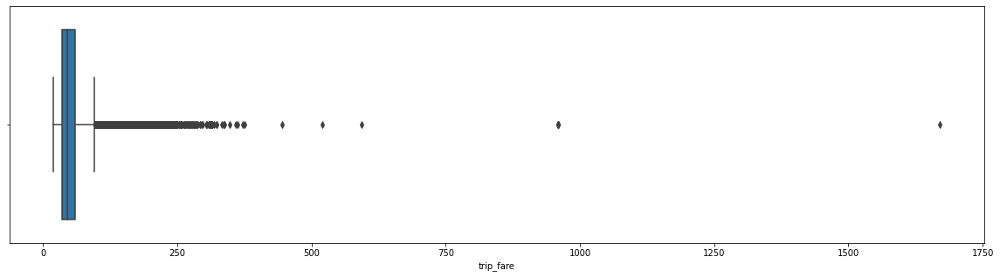

In [619]:
plt.figure(figsize = (20,5))
sns.boxplot(df.trip_fare)
plt.show()

In [620]:
df.trip_fare.groupby(pd.cut(df.trip_fare, np.arange(1,500,100))).count()

trip_fare
(1, 101]      41533
(101, 201]     2785
(201, 301]      236
(301, 401]       23
Name: trip_fare, dtype: int64

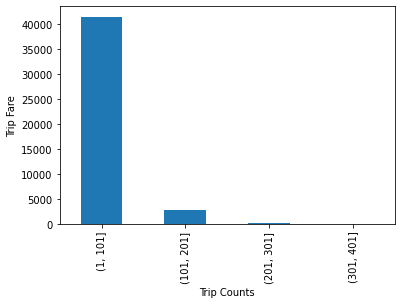

In [621]:
df.trip_fare.groupby(pd.cut(df.trip_fare, np.arange(1,500,100))).count().plot(kind='bar')
plt.xlabel('Trip Counts')
plt.ylabel('Trip Fare')
plt.show()

In [622]:
df.groupby('customer_id').count()


,trip_id,timestamp,pick_lat,pick_lng,drop_lat,drop_lng,travel_distance,travel_time,trip_fare
customer_id,,,,,,,,,
CUST_001,8,8,8,8,8,8,8,8,8
CUST_002,1,1,1,1,1,1,1,1,1
CUST_003,6,6,6,6,6,6,6,6,6
CUST_004,15,15,15,15,15,15,15,15,15
CUST_005,2,2,2,2,2,2,2,2,2
...,...,...,...,...,...,...,...,...,...
CUST_9995,1,1,1,1,1,1,1,1,1
CUST_9996,1,1,1,1,1,1,1,1,1
CUST_9997,3,3,3,3,3,3,3,3,3


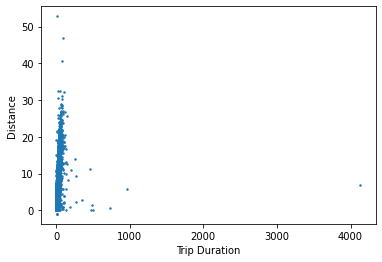

In [623]:
plt.scatter(df.travel_time, df.travel_distance , s=2, alpha=1)
plt.ylabel('Distance')
plt.xlabel('Trip Duration')
plt.show()

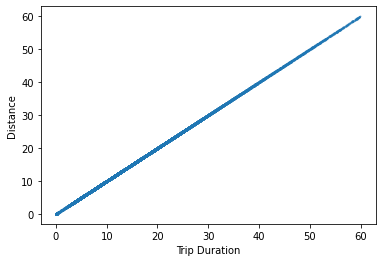

In [624]:
dur_dist = df.loc[(df.travel_distance < 30) & (df.travel_time < 60), ['travel_distance','travel_time']]
plt.scatter(dur_dist.travel_time, dur_dist.travel_time , s=1, alpha=0.5)
plt.ylabel('Distance')
plt.xlabel('Trip Duration')
plt.show()

In [0]:
df = df[~((df.travel_distance == 0) & (df.travel_time >= 60))]

In [0]:
duo = df.loc[(df['travel_distance'] <= 1) & (df['travel_time'] >= 60),['travel_distance','travel_time']].reset_index(drop=True)

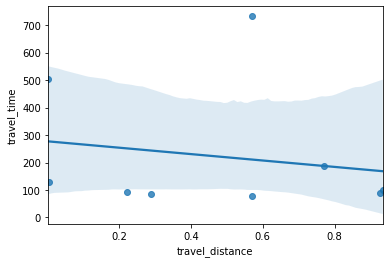

In [627]:
sns.regplot(duo.travel_distance, duo.travel_time)
plt.show()

In [628]:
!apt install proj-bin libproj-dev libgeos-dev

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libgeos-dev is already the newest version (3.6.2-1build2).
libproj-dev is already the newest version (4.9.3-2).
proj-bin is already the newest version (4.9.3-2).
0 upgraded, 0 newly installed, 0 to remove and 25 not upgraded.


In [629]:
!pip install -U git+https://github.com/matplotlib/basemap.git

  Cloning https://github.com/matplotlib/basemap.git to /tmp/pip-req-build-75qxlwdj
  Running command git clone -q https://github.com/matplotlib/basemap.git /tmp/pip-req-build-75qxlwdj
  Created wheel for basemap: filename=basemap-1.2.1-cp36-cp36m-linux_x86_64.whl size=121756019 sha256=b49f21fad58aefdf31e7919e567b4c8b30a9e96b9ab16a8db0fac858b427d2c5
  Stored in directory: /tmp/pip-ephem-wheel-cache-m40lzlfl/wheels/3f/f3/56/de548b66967d0d661612b7618022e2c0d4b86b9a638cf6ccf3
Successfully built basemap
  Found existing installation: basemap 1.2.1
    Uninstalling basemap-1.2.1:
      Successfully uninstalled basemap-1.2.1


In [630]:
!pip install pyproj==1.9.6

In [0]:
def map_marker(set):
    # Import package for map
    from mpl_toolkits.basemap import Basemap
    plt.figure(figsize = (20,20))

    # Set the limits of the map to the minimum and maximum coordinates
    lat_min = data["pick_lat"].min() - .2
    lat_max = data["pick_lat"].max() + .2
    lon_min = data["pick_lng"].min() - .2
    lon_max = data["pick_lng"].max() + .2

    # Set the center of the map
    cent_lat = (lat_min + lat_max) / 2
    cent_lon = (lon_min + lon_max) / 2

    #Create the Basemap object with required params.
    map = Basemap(llcrnrlon=lon_min,
                  llcrnrlat=lat_min,
                  urcrnrlon=lon_max,
                  urcrnrlat=lat_max,
                  resolution='l',
                  projection='tmerc',
                  lat_0 = cent_lat,
                  lon_0 = cent_lon)
    map.drawmapboundary()
    map.drawcoastlines()
    map.fillcontinents()
    map.drawcountries(linewidth=2)
    map.drawstates()


    #Fetch the long and lat in form of array
    lng = np.array(data["pick_lng"])
    lat = np.array(data["pick_lat"])

    x, y = map(lng, lat)
    map.plot(x, y,'ro', markersize=2, alpha=1)

    plt.show()

In [632]:
df[df.pick_lat == df.pick_lng.min()]

,trip_id,customer_id,timestamp,pick_lat,pick_lng,drop_lat,drop_lng,travel_distance,travel_time,trip_fare


In [0]:
data = df[df.pick_lng != df.pick_lng.min()]

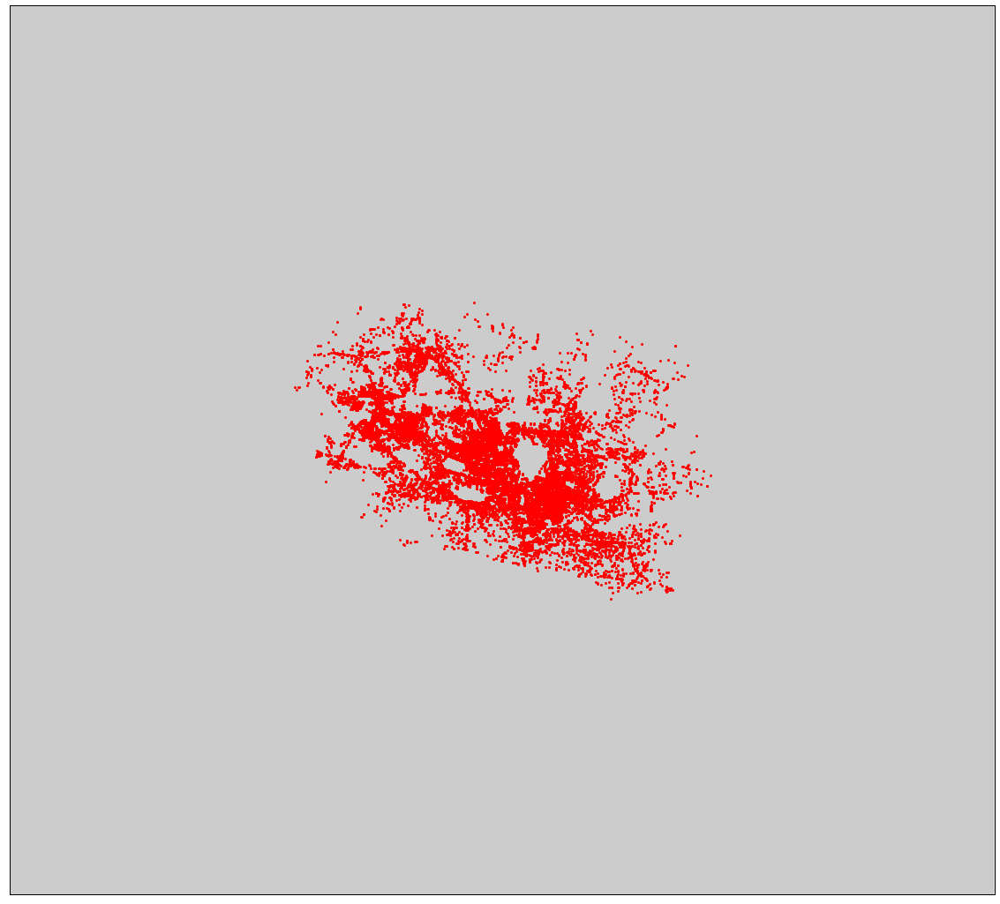

In [634]:
map_marker(data)




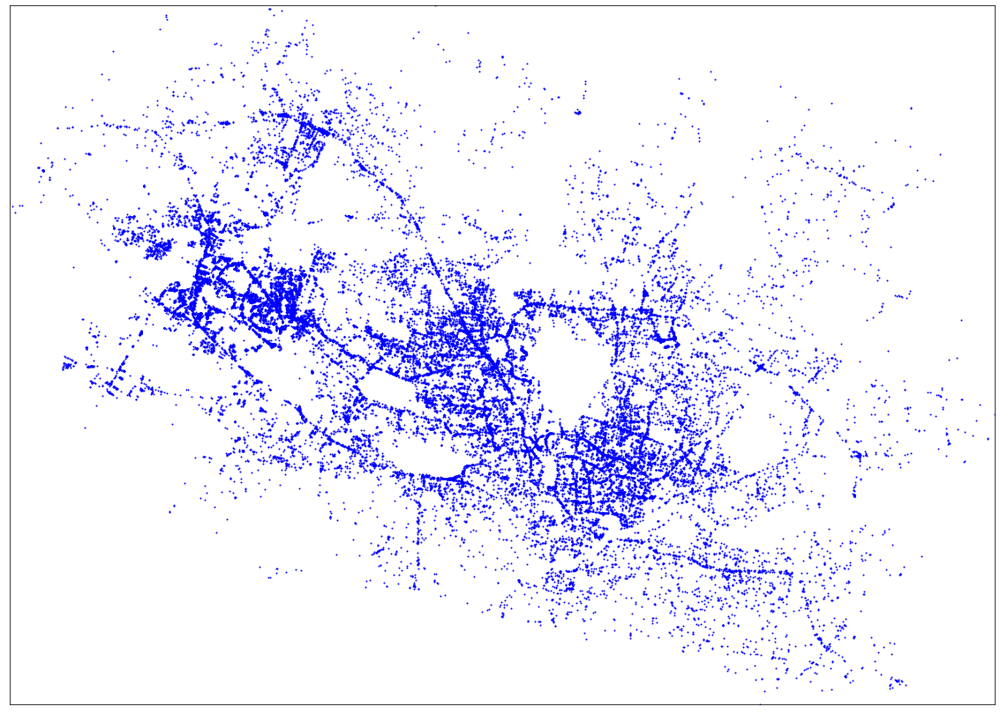

In [635]:
plt.figure(figsize=(20,20))
from mpl_toolkits.basemap import Basemap

# Set the limits of the map to the minimum and maximum coordinates
lat_min = df['pick_lat'].min()
lat_max = df['pick_lat'].max()
lon_min = df['pick_lng'].min()
lon_max = df['pick_lng'].max()

# Set the center of the map
cent_lat = (lat_min + lat_max) / 2
cent_lon = (lon_min + lon_max) / 2

#Create the Basemap object with required params.
map = Basemap(llcrnrlon=lon_min,
              llcrnrlat=lat_min,
              urcrnrlon=lon_max,
              urcrnrlat=lat_max,
              resolution='l',
              projection='tmerc',
              lat_0 = cent_lat,
              lon_0 = cent_lon)

#Style the map
# map.drawcounties()

#Fetch the long and lat in form of array
long = np.array(data["pick_lng"])
lat = np.array(data["pick_lat"])

x, y = map(long, lat)
map.plot(x, y,'bo', markersize=1, alpha=1)
plt.xticks()
plt.show()

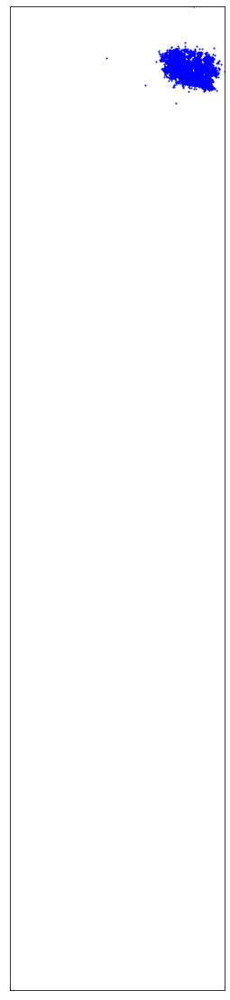

In [636]:
plt.figure(figsize=(20,20))
from mpl_toolkits.basemap import Basemap

# Set the limits of the map to the minimum and maximum coordinates
lat_min = df['drop_lat'].min()
lat_max = df['drop_lat'].max()
lon_min = df['drop_lng'].min()
lon_max = df['drop_lng'].max()

# Set the center of the map
cent_lat = (lat_min + lat_max) / 2
cent_lon = (lon_min + lon_max) / 2

#Create the Basemap object with required params.
map = Basemap(llcrnrlon=lon_min,
              llcrnrlat=lat_min,
              urcrnrlon=lon_max,
              urcrnrlat=lat_max,
              resolution='l',
              projection='tmerc',
              lat_0 = cent_lat,
              lon_0 = cent_lon)

#Style the map
# map.drawcounties()

#Fetch the long and lat in form of array
long = np.array(data["drop_lng"])
lat = np.array(data["drop_lat"])

x, y = map(long, lat)
map.plot(x, y,'bo', markersize=1, alpha=1)
plt.xticks()
plt.show()

In [637]:
list(zip( range(0,len(df.columns)),df.columns))

[(0, 'trip_id'),
 (1, 'customer_id'),
 (2, 'timestamp'),
 (3, 'pick_lat'),
 (4, 'pick_lng'),
 (5, 'drop_lat'),
 (6, 'drop_lng'),
 (7, 'travel_distance'),
 (8, 'travel_time'),
 (9, 'trip_fare')]

In [638]:
df.dtypes


trip_id             object
customer_id         object
timestamp            int64
pick_lat           float64
pick_lng           float64
drop_lat           float64
drop_lng           float64
travel_distance    float64
travel_time        float64
trip_fare            int64
dtype: object

In [639]:
data = df.drop(['pick_lat','pick_lng','drop_lat','drop_lng','customer_id','trip_id','timestamp'], axis=1)
print(data.describe())

       travel_distance   travel_time     trip_fare
count     44586.000000  44586.000000  44586.000000
mean          5.094474     15.809577     53.873593
std           3.364959     23.362931     33.430452
min          -1.000000      0.022750     20.000000
25%           2.745000      8.428487     36.000000
50%           4.299500     13.125633     46.000000
75%           6.679750     20.110933     60.000000
max          52.801000   4134.388700   1670.000000


In [0]:
data = data.astype(float)

In [641]:
data.dtypes

travel_distance    float64
travel_time        float64
trip_fare          float64
dtype: object

In [0]:
import pandas as pd
import numpy as np
from sklearn import linear_model
from sklearn.metrics import accuracy_score
import sklearn.metrics as metrics
features=['travel_distance','travel_time']
X = df[features] # here we have 2 variables for multiple regression. If you just want to use one variable for simple linear regression, then use X = df['Interest_Rate'] for example.Alternatively, you may add additional variables within the brackets
X_train, X_test, y_train, y_test = train_test_split(X,Y, random_state=4, test_size=0.2)


In [643]:
regr = linear_model.LinearRegression()
regr.fit(X, Y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [644]:
print('Intercept: \n', regr.intercept_)
print('Coefficients: \n', regr.coef_)

Intercept: 
 8.79229376472479
Coefficients: 
 [8.76989738 0.02550909]


In [0]:
y_pred = regr.predict(X_test)

In [646]:

print('RMSE score for the Multiple LR raw is : {}'.format(np.sqrt(metrics.mean_squared_error(y_test,y_pred))))
print('Variance score for the Multiple LR raw is : %.2f' % regr.score(X_test, y_test))
print("\n")

RMSE score for the Multiple LR raw is : 12.602841924683393
Variance score for the Multiple LR raw is : 0.85




In [647]:
travel_distance = 3.5
travel_time = 15
print ('Predicted Stock Index Price: \n', regr.predict([[travel_distance ,travel_time]]))

Predicted Stock Index Price: 
 [39.86957098]


In [648]:
!pip install h3==3.1.0 pandas>=0.23 geojson==2.4.1 folium==0.7.0 seaborn==0.9.0 area==1.1.1 statsmodels==0.9.0 EOF

ERROR: Could not find a version that satisfies the requirement EOF (from versions: none)
ERROR: No matching distribution found for EOF


In [649]:
%%sh
pip3 freeze | grep -E 'ipython|jupyter'

ipython==5.5.0
ipython-genutils==0.2.0
ipython-sql==0.3.9
jupyter==1.0.0
jupyter-client==5.3.4
jupyter-console==5.2.0
jupyter-core==4.6.3


In [0]:
%%sh
cat <<EOF > requirements_demo.txt
h3==3.1.0
pandas>=0.23
geojson==2.4.1
folium==0.7.0
seaborn==0.9.0
area==1.1.1
statsmodels==0.9.0
EOF

In [0]:
%%sh
pip3 install -U --quiet -r requirements_demo.txt

In [652]:
%%sh
pip3 freeze | grep -E 'h3|pandas|geojson|folium|seaborn|area|statsmodels'

area==1.1.1
folium==0.7.0
geojson==2.4.1
h3==3.1.0
pandas==1.0.3
pandas-datareader==0.8.1
pandas-gbq==0.11.0
pandas-profiling==1.4.1
seaborn==0.9.0
sklearn-pandas==1.8.0
statsmodels==0.9.0


In [0]:
from IPython.core.display import display, HTML
#display(HTML("<style>.container { width:100% !important; }</style>"))

In [0]:
from h3 import h3

In [0]:
import json
import pandas as pd
from pandas.io.json import json_normalize
import numpy as np

import statistics

from geojson.feature import *
from area import area

import copy

In [0]:
from folium import Map, Marker, GeoJson
from folium.plugins import MarkerCluster
import branca.colormap as cm
from branca.colormap import linear
import folium

import seaborn as sns
import matplotlib.pyplot as plt

In [0]:
from IPython.display import Image, display
from IPython.utils.text import columnize
import warnings
warnings.filterwarnings('ignore')

In [0]:
%matplotlib inline

In [0]:
df['pick_longitude'] = df["pick_lng"]
df['pick_latitude']=df['pick_lat']
df['drop_longitude']=df['drop_lng']
df['drop_latitude']=df['drop_lng']
    

In [660]:
print("Total number of pickup locations stops in original dataset", df.shape[0])
df_raw = df.drop_duplicates(subset=["pick_lat","pick_lng","drop_lng","drop_lng"])
print("Total number of pickup locations stops in deduplicated dataset", df_raw.shape[0])

Total number of pickup locations stops in original dataset 44586
Total number of pickup locations stops in deduplicated dataset 44583


In [661]:
lat_min = df['pick_lat'].mean()
lat_max = df['pick_lng'].mean()
print(lat_min,lat_max)

17.427919241288663 78.43554230453009


In [663]:
m = Map(location= [17.427919241288663,78.43554230453009], zoom_start=11, tiles="cartodbpositron", 
        attr= '© <a href="http://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors © <a href="http://cartodb.com/attributions#basemaps">CartoDB</a>' 
)
mc = MarkerCluster()

for i,row in df_raw.iterrows():
    mk = Marker(location=[row["pick_lat"],row["pick_lng"]])
    mk.add_to(mc)
    
mc.add_to(m)

m.save('graph.html')
m

In [0]:
df_location = df_raw.copy()
df_location= df_raw[["pick_lat", "pick_lng","drop_lat","drop_lng"]]
df_location.to_csv(path_or_buf="pickup_long_lat.csv", header=True, index=False)

In [0]:
def counts_by_hexagon(df, resolution):
    
    '''Use h3.geo_to_h3 to index each data point into the spatial index of the specified resolution.
      Use h3.h3_to_geo_boundary to obtain the geometries of these hexagons'''

    df = df[["pick_lat","pick_lng"]]
    
    df["hex_id"] = df.apply(lambda row: h3.geo_to_h3(row["pick_lat"], row["pick_lng"], resolution), axis = 1)
    
    df_aggreg = df.groupby(by = "hex_id").size().reset_index()
    df_aggreg.columns = ["hex_id", "value"]
    
    df_aggreg["geometry"] =  df_aggreg.hex_id.apply(lambda x: 
                                                           {    "type" : "Polygon",
                                                                 "coordinates": 
                                                                [h3.h3_to_geo_boundary(h3_address=x,geo_json=True)]
                                                            }
                                                        )
    
    return df_aggreg

In [667]:
df_aggreg = counts_by_hexagon(df = df_raw, resolution = 8)
print(df_aggreg.shape)
df_aggreg.sort_values(by = "value", ascending = False, inplace = True)
df_aggreg.head(5)

(583, 3)


,hex_id,value,geometry
236,8860a259b9fffff,1288,"{'type': 'Polygon', 'coordinates': [[[78.39256..."
237,8860a259bbfffff,933,"{'type': 'Polygon', 'coordinates': [[[78.38394..."
220,8860a25995fffff,933,"{'type': 'Polygon', 'coordinates': [[[78.38810..."
49,8860a24a65fffff,798,"{'type': 'Polygon', 'coordinates': [[[78.37115..."
53,8860a24a6dfffff,720,"{'type': 'Polygon', 'coordinates': [[[78.37531..."
